# Notebook for quality control of MEG data

Authors: Lucas Breedt & Mona Zimmerman

This notebook is meant to help in checking MEG data.  
Note that pre-processing of the data is not included in this notebook -- it assumes data have already been processed

## Table of contents
1. [Imports](#imports)
2. [Load data](#load-data)
3. [Checking the data - I](#data-check-1)  
    a. [Visual inspection of the epochs](#visual-inspection)  
    b. [The power spectrum](#power-spectrum)  
4. [Fast Fourier transform & defining functional connectivity](#fft-fc)  
    a. [The Phase Lag Index (PLI)](#pli)  
    b. [The Amplitude Envelope Correlation (AEC)](#aec)
5. [Checking the data - II](#data-check-2)  
    a. [Adjacency matrices](#adjacency-matrix)  
    b. [Check for weird/empty signals](#check-signal)  
    c. [The occipital network](#occ-network)  

In [ ]:
### TO DO:
# --- calculate PLI for multiple/all epochs (of multiple subs)
# --- compare plot & AEC to BrainWave
# --- check/improve structure of notebook
# --- check imports (which are and which aren't necessary?)
# --- improve/clean up/add text & explanation
# --- set up similarly to Eduarda & Fernando's TDA notebook - functions separately?

<a id='imports'></a>
## **1.** Imports
#### Let's first import all the necessary packages...

In [1]:
# Basic libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.graph_objects import Layout, YAxis, Scatter, Annotation, Annotations, Data, Figure, Marker, Font
from tqdm import tqdm
import matplotlib as mpl
import scipy
import statsmodels.api as sm
import math
import os

# Signal processing libraries
from scipy import signal
from scipy.signal import hilbert
from scipy.fft import fft, irfft2, ifft2, irfftn, irfft, ifft
from scipy.fftpack import hilbert

# Set seaborn style for plot syling
sns.set()

In [2]:

import statsmodels.api as sm
import math



<a id='load-data'></a>
## **2.** Load data
#### ...and load the MEG data.

In [4]:
# Loading a single ascii of one subject
#file = pd.read_csv('/home/kingwizard/mumo_projects/meg_datacheck/meg_data/sub_01/OD1_Tr01.asc', 
 #                  delimiter='\t', header=None, index_col=False)

file = pd.read_csv('/mnt/resource/m.zimmermann/move/meg_data/sub-0004/T1/BNA/0004_Tr01.asc', 
                   delimiter='\t', header=None, index_col=False)

In [ ]:
# Load all asciis
### --- I guess for one sub for now - would be nice to write some sort of loop/function to do it for all
### --- subs in a folder 

##### The shape of the file should be the number of samples in your epoch x the number of regions; so let's do a quick check just to make sure:

In [5]:
file.shape

(16384, 246)

In [6]:
# Convert the data from a dataframe to a numpy array for future operations
file_np = file.to_numpy()

<a id='data-check-1'></a>
## **3.** Checking the data - I
<a id='visual-inspection'></a>
### a. Visual inspection of the epochs
As a quick visual check of your data, we'll now plot the first 3 seconds of data of every 10th region of one epoch; this should give you a global overview of the data.

In [7]:
### --- should regions be a list? so people can decide which regions they want to include? and then maybe
### --- we can add a parameter to choose between every nth channel or exact specified channels
def plot_timeseries(file_np, fs=1250, seconds_to_plot=3, start=0, regions=210, step=10):
    """ Plot several seconds of data from multiple channels of timeseries data
    
    Parameters
    ----------
    file_np: ndarray
        Rows are timepoints, columns are rois/electrodes
    fs: int, optional
        Sample frequency, default=1250
    seconds_to_plot: int, optional
        Amount of seconds of data to be plotted, default=3 seconds
    start: int, optional
        Starting point of plot, default=0 (ie beginning of timeseries)
    regions: int, ndarray, optional
        Number or range of regions you wish to use
    step: int, optional
        Plot every nth channel, default=10 (ie plot every 10th channel)
        
    Returns
    -------
    plot?
        
    Notes
    -----
    Code used in this function was adapted from https://plotly.com/python/v3/ipython-notebooks/mne-tutorial/

    """

    ns = file.shape[0] # total number of samples per epoch
    time = np.linspace(0, ns/fs, ns) # time in seconds per sample
    time_stp = time[fs*start:(fs*start + (fs*seconds_to_plot -1))] # this will be the x-axis of the plot, indicating the time in seconds
    file_stp = file_np[fs*start:(fs*start + (fs*seconds_to_plot -1))] # this is a subset of the epoch, containing stp seconds of data
    
    if type(regions) != int:
        channels = np.arange(regions[0], regions[-1]+1, step=step)
    else:
        channels = np.arange(step-1, regions, step=step)
        
    n_channels = len(channels)
    
    step = 1. / n_channels
    kwargs = dict(domain=[1 - step, 1], showticklabels=False, zeroline=False, showgrid=False)
    
    # create objects for layout and traces
    layout = Layout(yaxis=YAxis(kwargs), showlegend=False)
    traces = [Scatter(x=time_stp, y=file_stp[:, 0])]
    
    # loop over the channels
    for ii in range(1, n_channels):
            kwargs.update(domain=[1 - (ii + 1) * step, 1 - ii * step])
            layout.update({'yaxis%d' % (ii + 1): YAxis(kwargs), 'showlegend': False})
            traces.append(Scatter(x=time_stp, y=file_stp[:, channels[ii]], yaxis='y%d' % (ii + 1)))
    
    # add channel names using Annotations
    annotations = Annotations([go.layout.Annotation(x=-0.06, y=0, xref='paper', yref='y%d' % (ii + 1), 
                                                    text='ROI ' + str(channels[ii] + 1), showarrow=False)
                              for ii in range(0, n_channels)])
    layout.update(annotations=annotations)
    
    # set the size of the figure and plot it
    layout.update(autosize=False, width=1000, height=800, 
                  title={'text':'<b>Time: '+str(start)+'s - '+str(start+seconds_to_plot)+'s</b>',
                         'y':0.9,
                         'x':0.5,
                        'yanchor':'top',
                        'xanchor':'center'},
                  xaxis=dict(showticklabels=False, tickmode='array', tickvals=np.arange(start+1, 
                                                                                        start+seconds_to_plot+1, 1)))
    #x_values = list(range(1,11))
    #xaxes_dict = [dict(x=x_val, y=-0.5, xref='x', yref='y10', text=str(x_val), 
    #                   showarrow=False) for x_val in x_values]
    #xaxis_title = [dict(x=2.6, y=-0.5, xref='x', yref='y10', text="Time (s)", showarrow=False)]
    #axes_dict = xaxes_dict + xaxis_title + yaxes_dict 
    #layout.update(annotations=axes_dict)
    fig = Figure(data=Data(traces), layout=layout)
    
    return go.Figure(fig)

##### You'll have to set some variables first; change these to fit your needs.

In [8]:
fs = 1250 # sample size; so this is the amount of samples per second
seconds_to_plot = 3 # indicate how many seconds of data you want to plot
start = 0 # start-time of plot in seconds; indicate where you want plot to start (default = 0 for first stp s) #REVIEW: what does stp mean? 
regions = 210 # number or range of regions you wish to use
step = 10 # set step size, every nth channel is plotted; default is 10, e.g. 1 would be every channel

##### And, finally, here is the plot, displaying a couple seconds of the timeseries of every 10th region of the epoch:

In [9]:
plot_timeseries(file_np, seconds_to_plot=seconds_to_plot, start=start, fs=fs, regions=regions, step=step)

/mnt/software/anaconda3/lib/python3.8/site-packages/plotly/graph_objs/_deprecations.py:572: DeprecationWarning: plotly.graph_objs.YAxis is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.layout.YAxis
  - plotly.graph_objs.layout.scene.YAxis

  warnings.warn(
/mnt/software/anaconda3/lib/python3.8/site-packages/plotly/graph_objs/_deprecations.py:62: DeprecationWarning: plotly.graph_objs.Annotations is deprecated.
Please replace it with a list or tuple of instances of the following types
  - plotly.graph_objs.layout.Annotation
  - plotly.graph_objs.layout.scene.Annotation

  warnings.warn(
/mnt/software/anaconda3/lib/python3.8/site-packages/plotly/graph_objs/_deprecations.py:31: DeprecationWarning: plotly.graph_objs.Data is deprecated.
Please replace it with a list or tuple of instances of the following types
  - plotly.graph_objs.Scatter
  - plotly.graph_objs.Bar
  - plotly.graph_objs.Area
  - plotly.graph_objs.Histogram
  - etc.

  warni

In [ ]:
#REVIEW Idea: maybe it would be nice to include some explanation of what you dont want to see. 
#Like a list of things to watch out for.

##### Nice! Now let's also plot a couple seconds of the timeseries in the occipital regions only - since that is where we would expect to see an alpha rhythm more clearly.

In [ ]:
#REVIEW Idea: I dont know what the expected level of the people is that are using the notebook, but maybe include  what a good alpha rythm should look like? 
#That would be handy for complete beginners. 

In [10]:
fs = 1250 # sample size; so this is the amount of samples per second
seconds_to_plot = 3 # indicate how many seconds of data you want to plot
start = 0 # start-time of plot in seconds; indicate where you want plot to start (default = 0 for first stp s)
regions = np.arange(188, 210) # number or range of regions you wish to use
step = 1 # set step size, every nth channel is plotted; default is 10, e.g. 1 would be every channel

In [11]:
plot_timeseries(file_np, seconds_to_plot=seconds_to_plot, start=start, fs=fs, regions=regions, step=step)

/mnt/software/anaconda3/lib/python3.8/site-packages/plotly/graph_objs/_deprecations.py:572: DeprecationWarning:

plotly.graph_objs.YAxis is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.layout.YAxis
  - plotly.graph_objs.layout.scene.YAxis


/mnt/software/anaconda3/lib/python3.8/site-packages/plotly/graph_objs/_deprecations.py:62: DeprecationWarning:

plotly.graph_objs.Annotations is deprecated.
Please replace it with a list or tuple of instances of the following types
  - plotly.graph_objs.layout.Annotation
  - plotly.graph_objs.layout.scene.Annotation


/mnt/software/anaconda3/lib/python3.8/site-packages/plotly/graph_objs/_deprecations.py:31: DeprecationWarning:

plotly.graph_objs.Data is deprecated.
Please replace it with a list or tuple of instances of the following types
  - plotly.graph_objs.Scatter
  - plotly.graph_objs.Bar
  - plotly.graph_objs.Area
  - plotly.graph_objs.Histogram
  - etc.




<a id='power-spectrum'></a>
### **b.** The power spectrum
Now we'll calculate and plot the power spectrum. Also, to ensure a dominant alpha rhythm is present occipitally, we will look at occipital versus non-occipital power spectra.

In [12]:
# First we define a function to calculate and plot the power spectrum -- this is taken from Tianne's scripts
# and slightly modified
### --- don't know if this is the best way to do it, maybe import from somewhere else?
### !NOTE! added option to save powerspectrum; if set to True it returns f and pxx, otherwise it doesn't
def cal_power_spectrum (timeseries, nr_rois=np.arange(210), fs=1250, 
            window='hamming', nperseg=4096, scaling='spectrum', 
            plot_figure=False, title_plot='average power spectrum', save_powspec=True):

    """ Calculate (and plot) power spectrum of timeseries
    
    Parameters
    ----------
    timeseries: DataFrame with ndarrays
        Rows are timepoints, columns are rois/electrodes
    nr_rois: int, optional
        Give list with rois/electrodes you want to include, 
        default=np.arange(210)
    fs: int, optional    
        Sample frequency, default=1250    
    window: str or tuple, optional
        Type of window you want to use, check spectral.py for details, 
        default='hamming'
    nperseg : int, optional    
        Length of each segment, default=4096
    scaling : str, optional
        'density' calculates the power spectral density (V**2/Hz), 'spectrum' 
        calculates the power spectrum (V**2), default='spectrum'
    plot_figure: bool, optional
        Creates a figure of the mean + std over all rois/electrodes, 
        default=False
    title_plot: str, optional
        Give title of the plot, default='average power spectrum'
    save_powspec: bool, optional
        If False, f and pxx are not returned (if only plot is required),
        default=True
        
    Returns
    -------
    f: ndarray
        Array with sample frequencies (x-asix of power spectrum plot)
    pxx: ndarray
        Columns of power spectra for each roi/VE
            
    """
  
    pxx = np.empty([int(nperseg/2+1), np.size(nr_rois)])
    
    i=0
    for roi in nr_rois:
        (f, pxx[:,i]) = signal.welch(timeseries[roi].values, fs, window, 
                                     nperseg, scaling=scaling)
        i=i+1
    if plot_figure==True:
        plt.figure(figsize=(20, 10))
        plt.plot(f, np.mean(pxx,1), color='teal', linewidth=3)
        #plt.plot(f, np.mean(pxx,1)+np.std(pxx,1), color='teal', linewidth=0.7)
        #plt.plot(f, np.mean(pxx,1)-np.std(pxx,1), color='teal', linewidth=0.7)
        #plt.fill_between(f, np.mean(pxx,1)+np.std(pxx,1), np.mean(pxx,1)
        #                 -np.std(pxx,1), color='teal', alpha=0.2)
        plt.xlim(0, 50)
        plt.xlabel('Frequency (Hz)')
        plt.title(title_plot, size=15, weight='bold')
        plt.show()
        
    if save_powspec==True:
        return f, pxx

##### We'll first look at the full powerspectrum...

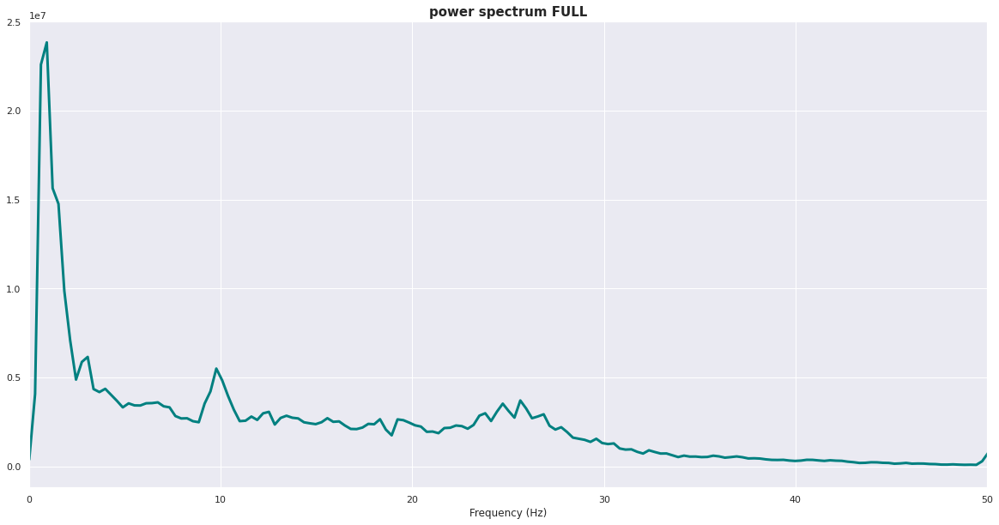

In [13]:
# Calculate and plot, for a single epoch of one subject, the full powerspectrum...
cal_power_spectrum(file, fs=fs, plot_figure=True, title_plot='power spectrum FULL', save_powspec=False)

##### ...but it's much more interesting to look at the powerspectrum of occipital vs non-occipital regions. 
alpha, yada yada

Specify which regions are occipital and which are non-occipital, and then we'll calculate powerspectrum for both.

In [14]:
occ_rois = np.arange(188,210) # Change this variable according to the atlas you used
nonocc_rois = np.arange(188) # Change this variable according to the atlas you used

f_occ, pxx_occ = cal_power_spectrum(file, fs=fs, nr_rois=occ_rois)
f_nonocc, pxx_nonocc = cal_power_spectrum(file, fs=fs, nr_rois=nonocc_rois)

##### And now we can make the plot. If all is well, the red powerspectrum should show a much higher peak around 8-12Hz (the alpha band) in the occipital compared to the non-occipital plots!

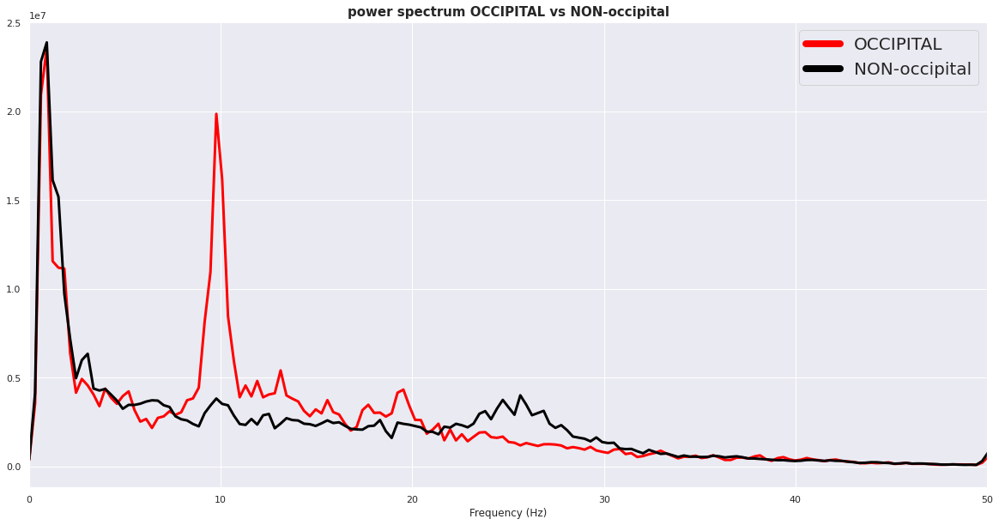

In [15]:
### --- see if we can add annotation to the lines themselves to point out occipital vs non-occipital
plt.figure(figsize=(20, 10))
plt.plot(f_occ, np.mean(pxx_occ,1), color='red', linewidth=3, label='OCCIPITAL')
plt.plot(f_nonocc, np.mean(pxx_nonocc, 1), color='black', linewidth=3, label='NON-occipital')
# add legend
leg = plt.legend(prop={'size': 20})
for line in leg.get_lines():
    line.set_linewidth(8)
#plt.plot(f, np.mean(pxx,1)+np.std(pxx,1), color='teal', linewidth=0.7)
#plt.plot(f, np.mean(pxx,1)-np.std(pxx,1), color='teal', linewidth=0.7)
#plt.fill_between(f, np.mean(pxx,1)+np.std(pxx,1), np.mean(pxx,1)
#                 -np.std(pxx,1), color='teal', alpha=0.2)
plt.xlim(0, 50)
plt.xlabel('Frequency (Hz)')
plt.title('power spectrum OCCIPITAL vs NON-occipital', size=15, weight='bold')
plt.show()

If all is well, you should see a much higher peak around 8-12Hz (the alpha band) in the occipital compared to the non-occipital (and full powerspectrum) plot(s)!

In [16]:
### --- add same plots for all epochs of one subject and all epochs of all subjects (grand average)

<a id='fft-fc'></a>
## **4.** Fast fourier transform & functional connectivity
#### Next, we'll filter the data into frequency bands and calculate functional connectivity.

In [17]:
def fft_filt(timeseries, thres1, thres2, fs=1250, nr_rois=np.arange(210)):
    
    """ Filter timeseries between the given frequency bands (thres1 and thres2)
    
    Parameters
    ----------
    timeseries: DataFrame with ndarrays
        Rows are timepoints, columns are rois/electrodes
    fs: int, optional
        Sample frequency, default=1250
    thres1: float
        Lower bound of frequency range data should be filtered between
    thres2: float
        Upper bound of frequency range data should be filtered between
    nr_rois: int, optional
        List of rois to be included, default=np.arange(210)
        
    Returns
    -------
    f: ndarray
        Array with filtered timeseries
    
    """
    
    f = np.empty([timeseries.shape[0], nr_rois.shape[0]])
    
    freq = np.arange(1/timeseries.shape[0], fs, fs/timeseries.shape[0])
    # include only frequency band of interest
    val, inx_thr1 = min((val, inx_thr1) for (inx_thr1, val) in enumerate(np.abs(freq - thres1)))
    val, inx_thr2 = min((val, inx_thr2) for (inx_thr2, val) in enumerate(np.abs(freq - thres2)))
    
    for roi in nr_rois:
        xdft = fft(timeseries[roi])
        
        # remove all other frequencies
        xdft[0:inx_thr1+1] = 0
        xdft[inx_thr2:xdft.shape[0]-inx_thr2-1] = 0
        xdft[xdft.shape[0]-(inx_thr1+1)-1:xdft.shape[0]] = 0
        
        f[:, roi] = irfft(xdft[0:int(len(xdft)/2+1)])
        
    return f

<a id='pli'></a>
### **b.** The Phase Lag Index (PLI)
As a first measure of functional connectivity, we'll define and calculate the PLI (ref?).

In [ ]:
#REVIEW Idea: Maybe add a short explanation of the PLI

In [18]:
def pli_matteo(filtered_timeseries):
    
    """ Calculate the phase lag index (ref) between all pairs of regions
    
    Parameters
    ----------
    filtered_timeseries: ndarray 
        Rows are timepoints, columns are rois/electrodes
    
    Returns
    -------
    m: ndarray
        Array with PLI between channel i and j averaged over timebins
        
    """
    
    N = nch = filtered_timeseries.shape[1]
    m = np.zeros([N, N])
    
    complex_a = signal.hilbert(filtered_timeseries, axis=0)
    
    for i in tqdm(np.arange(nch)):
        for j in np.arange(nch):
            if i < j:
                m[i, j] = abs(np.mean(np.sign(((complex_a[:, i]/complex_a[:, j]).imag))))
                
    m = m + np.transpose(m)
    return m

In [19]:
# Compute PLI in upper alpha band for first epoch piece (4096 samples)
file_epoch = file[:4096]
pli_alpha1 = pli_matteo(fft_filt(file_epoch, 8, 10))

# And set the diagonal to NaN so as not to show up in the plot
pli_alpha1_diagNaN = pli_alpha1.copy()
np.fill_diagonal(pli_alpha1_diagNaN, np.nan)

100%|██████████| 210/210 [00:01<00:00, 187.36it/s]


In [ ]:
#REVIEW: Is the above cell relevant later ? 

In [20]:
# Compute PLI of whole first epoch - so epoch pieces and then average
nperseg = 4096 # samples per epoch to compute PLI over
nr_rois = 210 # number of atlas regions to be used

epoch_length = np.arange(0, file.shape[0], nperseg)
temp_alpha1 = np.zeros((len(epoch_length), nr_rois, nr_rois)) # initialize output array
for temp in np.arange(len(epoch_length)):
    temp_mat = file[epoch_length[temp]:epoch_length[temp]+nperseg]
    temp_alpha1[temp,:,:] = pli_matteo(fft_filt(temp_mat, 8, 10))

100%|██████████| 210/210 [00:01<00:00, 200.52it/s]


In [21]:
# Compute average of 4 epoch segments
mean_pli_alpha1 = np.mean(temp_alpha1, axis=0)

# And set the diagonal to NaN so as not to show up in the plot
mean_pli_alpha1_diagNaN = mean_pli_alpha1.copy()
np.fill_diagonal(mean_pli_alpha1_diagNaN, np.nan)

In [ ]:
#REVIEW Idea: Give more info as to why we construct the mean PLI

<a id='aec'></a>
### **b.** The Amplitude Envelope Correlation (AEC)
Secondly, we'll define and calculate the AEC (ref?).

In [22]:
def smooth(a, WSZ):
    
    """ Smoothing function 
    Smoothes the input array using a moving average filter
    
    Parameters
    ----------
    a: ndarray 
        Array containing the data to be smoothed
    WSZ: int 
        Smoothing window size (must be odd)
    
    Returns
    -------
    smoothed: ndarray 
        Array containing the smoothed input data 
    
    Notes
    -----
    Reference: https://stackoverflow.com/a/40443565    
    """
    
    if WSZ % 2 == 0:
        WSZ -= 1
    
    out0 = np.convolve(a,np.ones(WSZ,dtype=int),'valid')/WSZ    
    r = np.arange(1,WSZ-1,2)
    start = np.cumsum(a[:WSZ-1])[::2]/r
    stop = (np.cumsum(a[:-WSZ:-1])[::2]/r)[::-1]
    smoothed = np.concatenate((  start , out0, stop  ))
    
    return smoothed

In [23]:
def envelopecorr(data, sm_param):
    
    """ Function to calculate amplitude envelope correlations
    
    Calculate the amplitude envelope correlation with pairwise 
    leakage correction as a measure of functional connectivity
    
    Parameters
    ----------
    data: ndarray
        Array containing filtered timeseries,
        rows are timpoints, columns are rois/electrodes 
    sm_param: int
        Smoothing window size (must be odd)
    verbose: bool, optional
        If true, progress is printed to console, default=False    
    
    Returns
    ------
    ENV_corr: nxn array of amplitude envelope correlations
    
    """
 
    ENV_corr = np.zeros((data.shape[1], data.shape[1]))
    for i in tqdm(range(0,data.shape[1])):
            
            x = data[:, i]
            htx = hilbert(x)
            htx = smooth(htx, sm_param)
            envelope_x = np.sqrt((np.power(np.real(htx),2) + np.power(np.imag(htx),2)))
            
            for j in range(0, data.shape[1]):
                if i != j:
                    y = data[:,j]
                    
                    #Regression
                    model = sm.OLS(y, x).fit()
                    #coeffs = model.params
                    #conf_inter = model.conf_int
                    resids = model.resid
                    
                    #step 1: compute the hilbert transform and bring it to the origin
                    hty = hilbert(resids)
                    hty = smooth(hty, sm_param)
                   
                    #step 2: compute envelope data
                    envelope_y = np.sqrt((np.power(np.real(hty),2) + 		np.power(np.imag(hty),2)))
                    
                    #correlation between envelopes 
                    ENV_corr[i,j] = np.corrcoef(envelope_x, envelope_y)[0,1]
        
    ENV_corr2 = (ENV_corr + ENV_corr.conj().T)/2
        
    return(ENV_corr2)

In [53]:
def get_data(filepath, sub, nr_epochs, nr_rois):
    """Function to get MEG data. 
    Extract all epochs of MEG data for the current subject. 
    
    Parameters
    ----------
    filepath: str, 
                path to directory in which MEG data is stored.
    
    sub: str,
            subject for which MEG data should be extracted e.g. 'sub_01'
    
    nr_epoch: int,
              number of epochs to extract per subject
              
    nr_rois: int,
             number of rois to be included in analysis
    
    Output
    ------
    all_epochs: pd.DataFrame, 
                contains the epochs of MEG data (for every roi) for the current subjects 
              
    """

        
    #get all asc files of subject that are in MEG directory of subject
    #REVIEW: Adapt this line of code depending on your folder structure! 
    #e.g. if you have subfolders add them to the path to get to the folder that has all asciis stored.
    path = os.path.join(filepath, sub) 
    files = [file for file in sorted(os.listdir(path))]
    #files = [file for file in sorted(os.listdir(filepath))]
    all_epochs = []    
    for j in range(0, nr_epochs): 
        
        #load every epoch (file) in directory of current subject and store in list  
        #current_epoch = pd.read_table(os.path.join(path, files[j]), header = None)
        current_epoch = pd.read_table(os.path.join(filepath, files[j]), header = None)
        all_epochs.append(current_epoch)
        
    #concatenate epochs in pd.DataFrame
    all_epochs = pd.concat(all_epochs)   
    
    return(all_epochs)

In [54]:
# Parameters:
sample_freq = 1250
f_low = 8 
f_high = 10 
nr_rois = 210
sm_param = math.floor(sample_freq * 0.25)
nr_epochs = 4

In [47]:
filepath = '/mnt/resource/m.zimmermann/move/meg_data/sub-0004/T1/BNA/'
#subs = ['sub_01']
subs = ['sub-0004']
for i, sub in enumerate(subs):
    print(sub)

sub-0004


In [52]:
# Loop through subjects:
AEC = np.zeros((nr_rois, nr_rois, len(subs)))

for i, sub in enumerate(subs):
    
    #1.) extract and concatenate all timeseries for subject i 
    timeseries = get_data(filepath, sub, nr_epochs, nr_rois)
    
    #2.) filter the data into frequency band
    data_filt = fft_filt(timeseries, f_low, f_high, sample_freq, np.arange(0,nr_rois))
    
    #3.) calculate and store amplitude envelope correlations 
    AEC[:, : , i] = envelopecorr(data_filt, sm_param)

100%|██████████| 210/210 [07:27<00:00,  2.13s/it]


In [72]:
### --- (AECc + 1)/2 to correct for negative values? -> this is clearly not in the function as seen by the
### adjacency matrix; but Shanna mentioned this in her presentation (@knw 21.02.26) -- and i think in an
### earlier email conversation as well, !!!LOOK THIS UP!!!

# Correct for negative values
aec_alpha1_corr = AEC[:, :, 0].copy()
aec_alpha1_corr = (aec_alpha1_corr + 1)/2

# Set diagonal to NaN
np.fill_diagonal(aec_alpha1_corr, np.nan)

# And convert to dataframe
df_aec_alpha1 = pd.DataFrame(data=aec_alpha1_corr)

<a id='data-check-2'></a>
## **5.** Checking the data - II
<a id='adjacency-matrix'></a>
### a. Adjacency matrices

Text(0.5, 1.0, 'PLI adjacency matrix - alpha1')

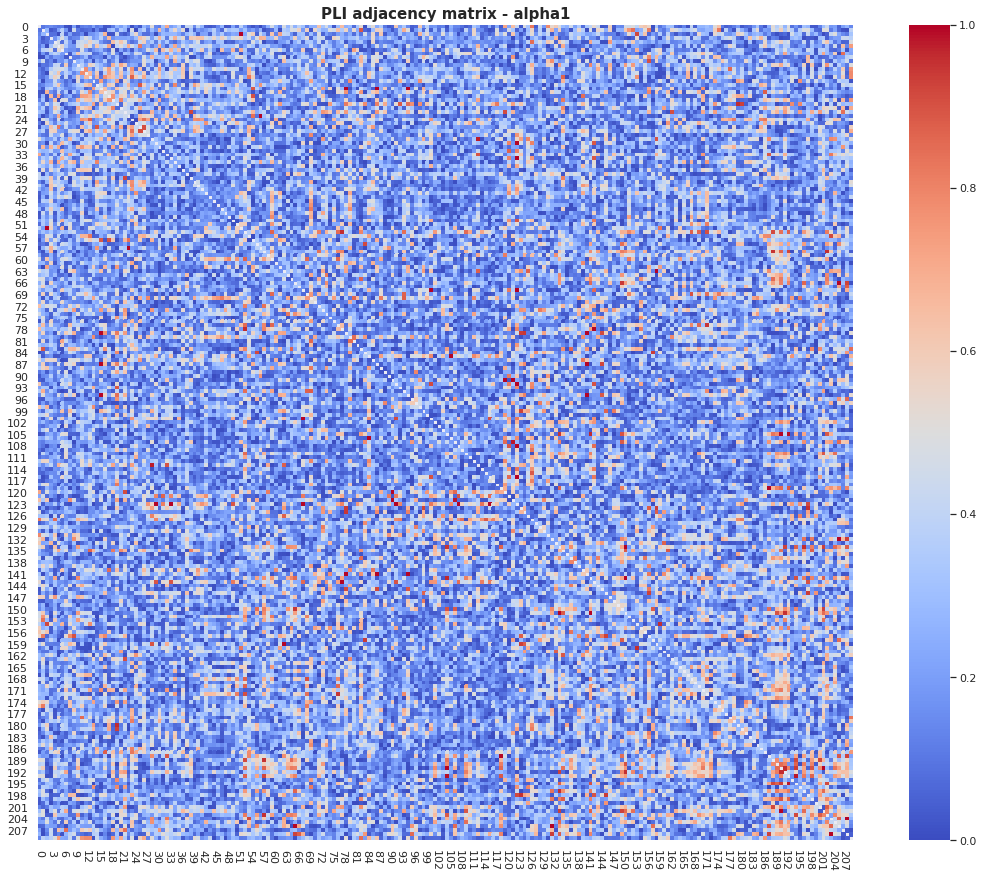

In [55]:
# Plot the correlation matrix of one epoch segment
plt.figure(figsize = (20, 15))
plt.xticks(rotation=270)
_ = sns.heatmap(pli_alpha1_diagNaN, cmap='coolwarm', cbar=True, square=True, mask=False, 
                xticklabels=3, yticklabels=3)
_.set_title('PLI adjacency matrix - alpha1', size=15, fontweight='bold')

In [ ]:
#REVIEW Idea: Maybe bullet points of what are signs of bad data quality.

Text(0.5, 1.0, 'PLI adjacency matrix - alpha1')

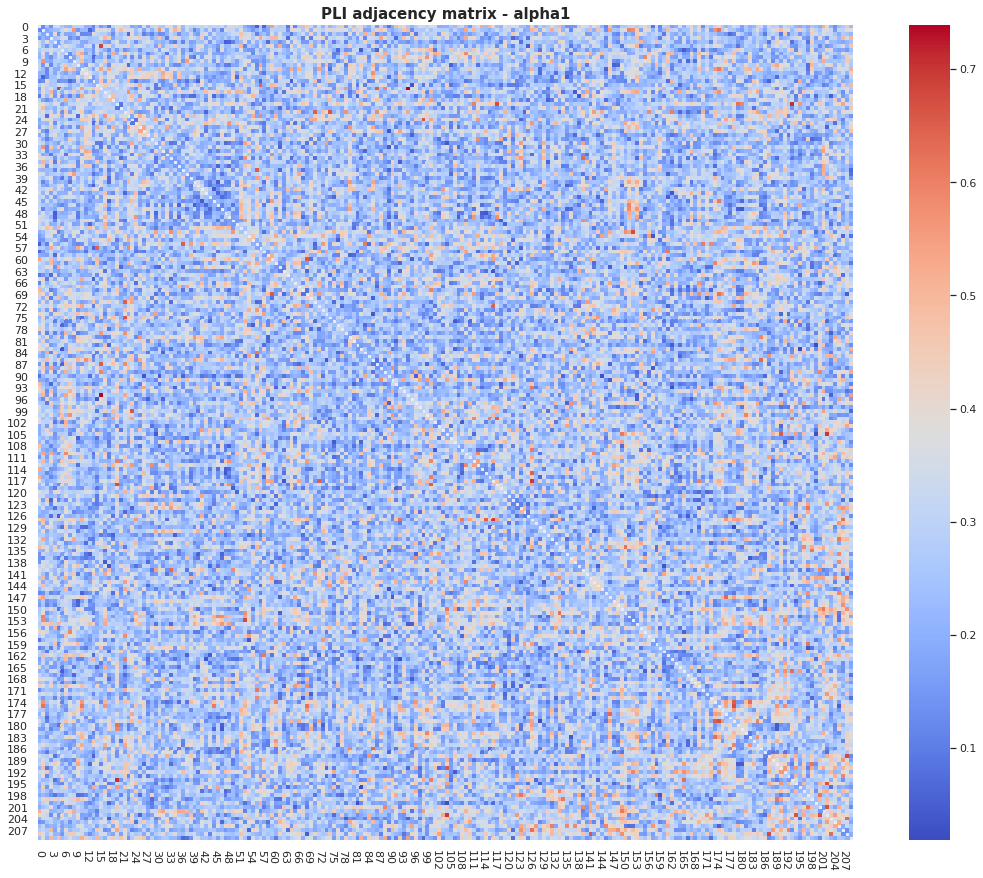

In [56]:
# Plot the average correlation matrix of one epoch (multiple segments)
plt.figure(figsize = (20, 15))
plt.xticks(rotation=270)
_ = sns.heatmap(mean_pli_alpha1_diagNaN, cmap='coolwarm', cbar=True, square=True, mask=False, 
                xticklabels=3, yticklabels=3)
_.set_title('PLI adjacency matrix - alpha1', size=15, fontweight='bold')

Text(0.5, 1.0, 'AEC adjacency matrix - alpha1')

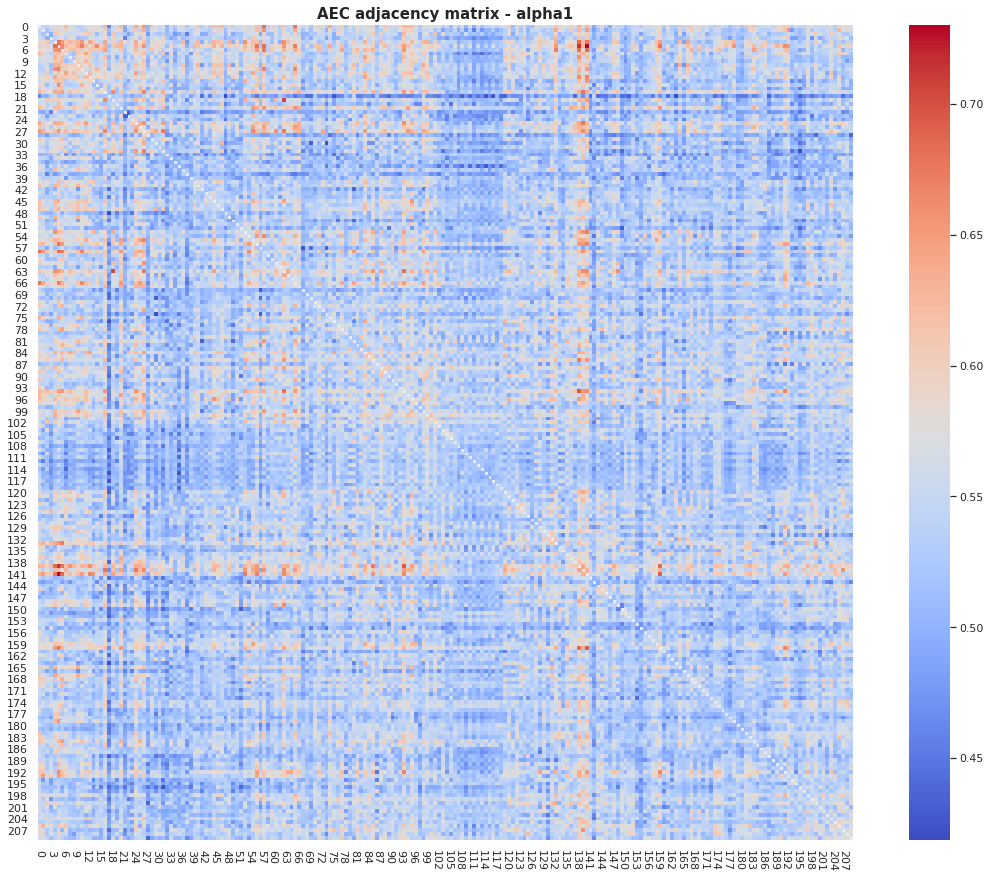

In [156]:
# Plot AEC correlation matrix of one subject
plt.figure(figsize = (20, 15))
plt.xticks(rotation=270)
_ = sns.heatmap(aec_alpha1_corr, cmap='coolwarm', cbar=True, square=True, mask=False, 
                xticklabels=3, yticklabels=3)
_.set_title('AEC adjacency matrix - alpha1', size=15, fontweight='bold')

<a id='check-signal'></a>
### b. Check for empty or weird signals

In [57]:
# Checking if there are NaNs, infs, zeros in the mean matrix
print('Matrix has Infs: ' + str(np.isinf(mean_pli_alpha1).any()))
print('Matrix has NaNs: ' + str(np.isnan(mean_pli_alpha1).any()))
print('Matrix has Zeros: ' + str((mean_pli_alpha1_diagNaN == 0).any()))

Matrix has Infs: False
Matrix has NaNs: False
Matrix has Zeros: False


/mnt/software/anaconda3/lib/python3.8/site-packages/seaborn/matrix.py:194: RuntimeWarning:

All-NaN slice encountered

/mnt/software/anaconda3/lib/python3.8/site-packages/seaborn/matrix.py:199: RuntimeWarning:

All-NaN slice encountered



Text(0.5, 1.0, 'Empty regions - mean PLI alpha1')

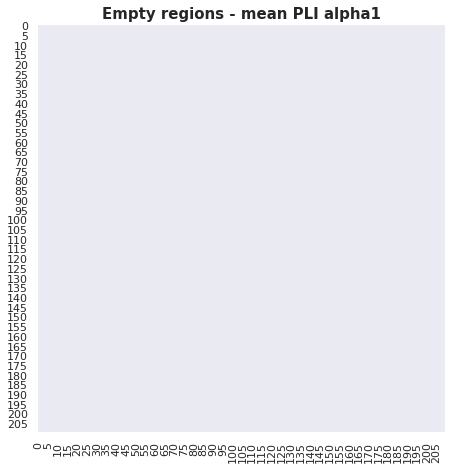

In [58]:
# Plot the correlation matrix with ONLY THE 0s!
cmap1 = mpl.colors.ListedColormap(['r'])

plt.figure(figsize = (10, 7.5))
plt.xticks(rotation=270)
_ = sns.heatmap(mean_pli_alpha1_diagNaN, mask=mean_pli_alpha1_diagNaN!=0, cmap=cmap1, cbar=False,
                square=True, xticklabels=5, yticklabels=5)
_.set_title('Empty regions - mean PLI alpha1', size=15, fontweight='bold')

In [59]:
# Checking if there are NaNs, infs, zeros IN ONE EPOCH PIECE - note that this isn't very informative
print('Matrix has Infs: ' + str(np.isinf(pli_alpha1).any()))
print('Matrix has NaNs: ' + str(np.isnan(pli_alpha1).any()))
print('Matrix has Zeros: ' + str((pli_alpha1 == 0).any()))

Matrix has Infs: False
Matrix has NaNs: False
Matrix has Zeros: True


In [ ]:
#REVIEW Idea: If it is not informative why include it ? 

Text(0.5, 1.0, 'Empty regions - PLI alpha1')

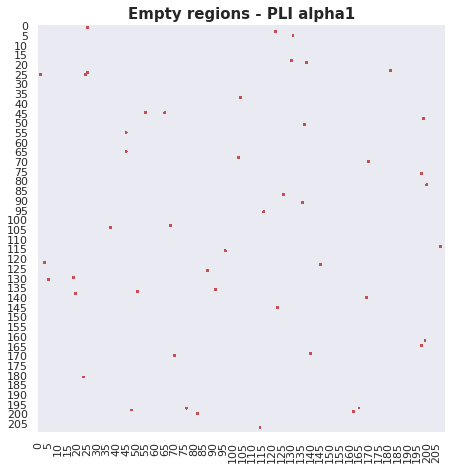

In [60]:
# Plot the correlation matrix with ONLY THE 0s!
cmap1 = mpl.colors.ListedColormap(['r'])

plt.figure(figsize = (10, 7.5))
plt.xticks(rotation=270)
_ = sns.heatmap(pli_alpha1_diagNaN, mask=pli_alpha1_diagNaN!=0, cmap=cmap1, cbar=False,
                square=True, xticklabels=5, yticklabels=5)
_.set_title('Empty regions - PLI alpha1', size=15, fontweight='bold')

<a id='occ-network'></a>
### c. The occipital network

#### The BNA is originally ordered left-right left-right; we'll re-order it to be all left-hem regions first, and all right-hem regions after that - and simultaneously we'll group regions belonging to the same Yeo subnetwork together.

In [ ]:
#REVIEW Idea: More info as to why we want to do these steps

In [61]:
df = pd.DataFrame(mean_pli_alpha1_diagNaN)

In [62]:
# View the initial ordering - should be from 0-N
df

,0,1,2,3,4,5,6,7,8,9,...,200,201,202,203,204,205,206,207,208,209
0,NaN,0.126221,0.260742,0.138550,0.336548,0.360474,0.261353,0.219238,0.212402,0.295166,...,0.231323,0.194336,0.520630,0.408203,0.202271,0.138916,0.229858,0.274170,0.457275,0.228149
1,0.126221,NaN,0.182983,0.213867,0.239990,0.236206,0.323853,0.390259,0.322144,0.562622,...,0.300293,0.245605,0.365845,0.353394,0.326294,0.154541,0.310791,0.303711,0.366455,0.390625
2,0.260742,0.182983,NaN,0.173462,0.405396,0.145386,0.309448,0.183960,0.184448,0.202759,...,0.341064,0.276001,0.386475,0.321045,0.327148,0.249634,0.192017,0.273315,0.250000,0.213867
3,0.138550,0.213867,0.173462,NaN,0.249023,0.263794,0.354370,0.355225,0.135620,0.177612,...,0.165405,0.387939,0.211548,0.129761,0.308350,0.302979,0.220947,0.504150,0.337158,0.503662
4,0.336548,0.239990,0.405396,0.249023,NaN,0.162109,0.313477,0.215332,0.231079,0.284058,...,0.217041,0.223389,0.210327,0.357788,0.226440,0.228882,0.200806,0.179688,0.209839,0.251221
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
205,0.138916,0.154541,0.249634,0.302979,0.228882,0.255005,0.188843,0.261841,0.143433,0.253296,...,0.342285,0.179810,0.306396,0.550293,0.356201,NaN,0.525024,0.322998,0.328979,0.183594
206,0.229858,0.310791,0.192017,0.220947,0.200806,0.293457,0.165771,0.219360,0.193237,0.239502,...,0.244751,0.521118,0.368774,0.404785,0.432983,0.525024,NaN,0.191528,0.337646,0.265991
207,0.274170,0.303711,0.273315,0.504150,0.179688,0.356445,0.180908,0.404907,0.227417,0.263428,...,0.249512,0.329468,0.244995,0.429688,0.382080,0.322998,0.191528,NaN,0.135010,0.262451
208,0.457275,0.366455,0.250000,0.337158,0.209839,0.225098,0.150391,0.313843,0.450073,0.450439,...,0.372192,0.290894,0.337769,0.401489,0.634033,0.328979,0.337646,0.135010,NaN,0.200073


In [63]:
# Define function to re-order regions of the BNA according to subnetwork; first left, 
# then right (similar to AAL)

def reorder(adjmat, subnet_filepath, subcortical=False):
    """" Reorder a connectivity matrix according to a specific ordering (e.g. BNA in order 
    of subnetwork, with all left hemisphere regions first and then all right hemisphere regions)
    
    Parameters
    ----------
    adjmat: dataframe
        Dataframe to be reordered
    subnet_filepath: string
        Path to tab-delimited .txt file containing desired order of regions
    subcortical: boolean, optional
        Specify whether there are subcortical regions in adjmat, default=False
        
    Returns
    -------
    adjmat_reorder: dataframe
        Reordered dataframe
        
    """
    
    subnetorder = pd.read_csv(subnet_filepath, delimiter='\t')
    
    if subcortical == False:
        subnetorder.drop(subnetorder[subnetorder['Yeo Labels'] == 'subcortical'].index, inplace=True)

    roiorder = subnetorder["BNA region"]
    roiorder = list(map(lambda x: x.replace('BNA ', ''), roiorder))
    roiorder_int = list(map(int, roiorder))
    roiorder_id = [x - 1 for x in roiorder_int]
    
    adjmat_reorder = adjmat[roiorder_id]
    adjmat_reorder = adjmat_reorder.loc[roiorder_id]
    
    return adjmat_reorder

In [64]:
subnet_filepath = './bna_subnetorder.txt'
df_reorder = reorder(df, subnet_filepath, subcortical=False)

In [65]:
df_reorder

,104,118,134,188,190,192,194,196,198,200,...,81,83,87,121,143,153,175,177,181,187
104,NaN,0.380005,0.151367,0.407104,0.194336,0.316772,0.407593,0.357300,0.368652,0.088501,...,0.233032,0.156738,0.071289,0.476318,0.255981,0.200195,0.097412,0.313721,0.454346,0.208130
118,0.380005,NaN,0.136719,0.255371,0.150513,0.130859,0.341797,0.278687,0.133179,0.254028,...,0.165161,0.229248,0.170532,0.250488,0.360107,0.402710,0.468506,0.339722,0.197510,0.315796
134,0.151367,0.136719,NaN,0.314697,0.282837,0.375610,0.244873,0.191406,0.310547,0.427612,...,0.328125,0.164673,0.209961,0.215332,0.336914,0.470825,0.427612,0.410522,0.100952,0.173462
188,0.407104,0.255371,0.314697,NaN,0.435669,0.514526,0.283081,0.225952,0.262695,0.296875,...,0.178955,0.160645,0.092651,0.184204,0.291260,0.327637,0.311768,0.185791,0.201782,0.116089
190,0.194336,0.150513,0.282837,0.435669,NaN,0.427002,0.106812,0.164673,0.169556,0.136597,...,0.358154,0.145996,0.306885,0.158813,0.264526,0.507446,0.567871,0.477661,0.045288,0.111206
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,0.200195,0.402710,0.470825,0.327637,0.507446,0.588623,0.292969,0.224609,0.181152,0.194458,...,0.283569,0.414917,0.134155,0.271118,0.257080,NaN,0.307495,0.402710,0.328613,0.388794
175,0.097412,0.468506,0.427612,0.311768,0.567871,0.581543,0.248169,0.258911,0.205933,0.114380,...,0.317505,0.485352,0.248413,0.292114,0.262329,0.307495,NaN,0.542114,0.283936,0.351196
177,0.313721,0.339722,0.410522,0.185791,0.477661,0.431152,0.341064,0.439209,0.264771,0.188354,...,0.383789,0.329102,0.245239,0.293823,0.066040,0.402710,0.542114,NaN,0.243408,0.285400
181,0.454346,0.197510,0.100952,0.201782,0.045288,0.138916,0.406860,0.202393,0.326172,0.292236,...,0.183350,0.114624,0.287476,0.305298,0.327393,0.328613,0.283936,0.243408,NaN,0.279663


#### The dataframe has been re-ordered! Now let's rename the columns and rows, so that their labels indicate the correct BNA region.

In [66]:
regs = pd.read_csv(subnet_filepath, delimiter='\t')
regs = regs.drop(regs[regs['Yeo Labels'] == 'subcortical'].index)
regs = regs.reset_index(drop=True)
names = {i: regs['BNA region'][j] for i, j in zip(list(df_reorder), range(len(df_reorder)))}
df_reorder = df_reorder.rename(index = names, columns = names)

In [67]:
df_reorder

,BNA 105,BNA 119,BNA 135,BNA 189,BNA 191,BNA 193,BNA 195,BNA 197,BNA 199,BNA 201,...,BNA 82,BNA 84,BNA 88,BNA 122,BNA 144,BNA 154,BNA 176,BNA 178,BNA 182,BNA 188
BNA 105,NaN,0.380005,0.151367,0.407104,0.194336,0.316772,0.407593,0.357300,0.368652,0.088501,...,0.233032,0.156738,0.071289,0.476318,0.255981,0.200195,0.097412,0.313721,0.454346,0.208130
BNA 119,0.380005,NaN,0.136719,0.255371,0.150513,0.130859,0.341797,0.278687,0.133179,0.254028,...,0.165161,0.229248,0.170532,0.250488,0.360107,0.402710,0.468506,0.339722,0.197510,0.315796
BNA 135,0.151367,0.136719,NaN,0.314697,0.282837,0.375610,0.244873,0.191406,0.310547,0.427612,...,0.328125,0.164673,0.209961,0.215332,0.336914,0.470825,0.427612,0.410522,0.100952,0.173462
BNA 189,0.407104,0.255371,0.314697,NaN,0.435669,0.514526,0.283081,0.225952,0.262695,0.296875,...,0.178955,0.160645,0.092651,0.184204,0.291260,0.327637,0.311768,0.185791,0.201782,0.116089
BNA 191,0.194336,0.150513,0.282837,0.435669,NaN,0.427002,0.106812,0.164673,0.169556,0.136597,...,0.358154,0.145996,0.306885,0.158813,0.264526,0.507446,0.567871,0.477661,0.045288,0.111206
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BNA 154,0.200195,0.402710,0.470825,0.327637,0.507446,0.588623,0.292969,0.224609,0.181152,0.194458,...,0.283569,0.414917,0.134155,0.271118,0.257080,NaN,0.307495,0.402710,0.328613,0.388794
BNA 176,0.097412,0.468506,0.427612,0.311768,0.567871,0.581543,0.248169,0.258911,0.205933,0.114380,...,0.317505,0.485352,0.248413,0.292114,0.262329,0.307495,NaN,0.542114,0.283936,0.351196
BNA 178,0.313721,0.339722,0.410522,0.185791,0.477661,0.431152,0.341064,0.439209,0.264771,0.188354,...,0.383789,0.329102,0.245239,0.293823,0.066040,0.402710,0.542114,NaN,0.243408,0.285400
BNA 182,0.454346,0.197510,0.100952,0.201782,0.045288,0.138916,0.406860,0.202393,0.326172,0.292236,...,0.183350,0.114624,0.287476,0.305298,0.327393,0.328613,0.283936,0.243408,NaN,0.279663


#### Great! That makes it much easier to interpret any plots as well. Speaking of plots-- let's have a look at the visual network in these data. We'll do so in two different ways. First up is highlighting the regions belonging to the visual network in the full matrix:

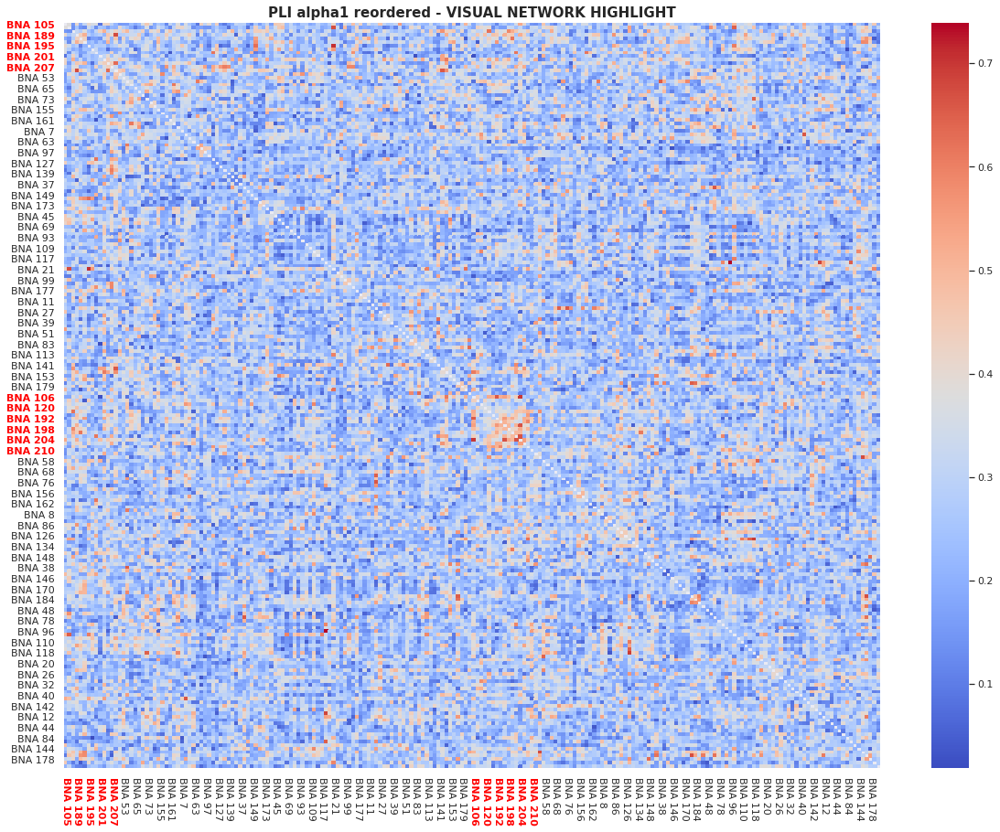

In [68]:
palette = 'coolwarm'

matdropped = df_reorder.dropna(axis=1, how='all').dropna(axis=0,how='all').copy()
plt.figure(figsize=(20,15))
plt.xticks(rotation=270)
ax = sns.heatmap(matdropped, cmap=palette, annot=False, xticklabels=3, yticklabels=3)
ax.set_title('PLI alpha1 reordered - VISUAL NETWORK HIGHLIGHT', size=15, fontweight='bold')

vis = np.where(regs==1)[0]
visNAMES = regs['BNA region'].iloc[vis]
visNAMES = list(visNAMES)
for laby,labx in zip(ax.get_yticklabels(), ax.get_xticklabels()):
    texty = laby.get_text()
    textx = labx.get_text()
    if texty in visNAMES:
        laby.set_weight('bold')
        laby.set_color('red')
    if textx in visNAMES:
        labx.set_weight('bold')
        labx.set_color('red')

#### Second-- plotting only the regions of the visual network:

Text(0.5, 1.0, 'PLI alpha1 - VISUAL NETWORK ONLY')

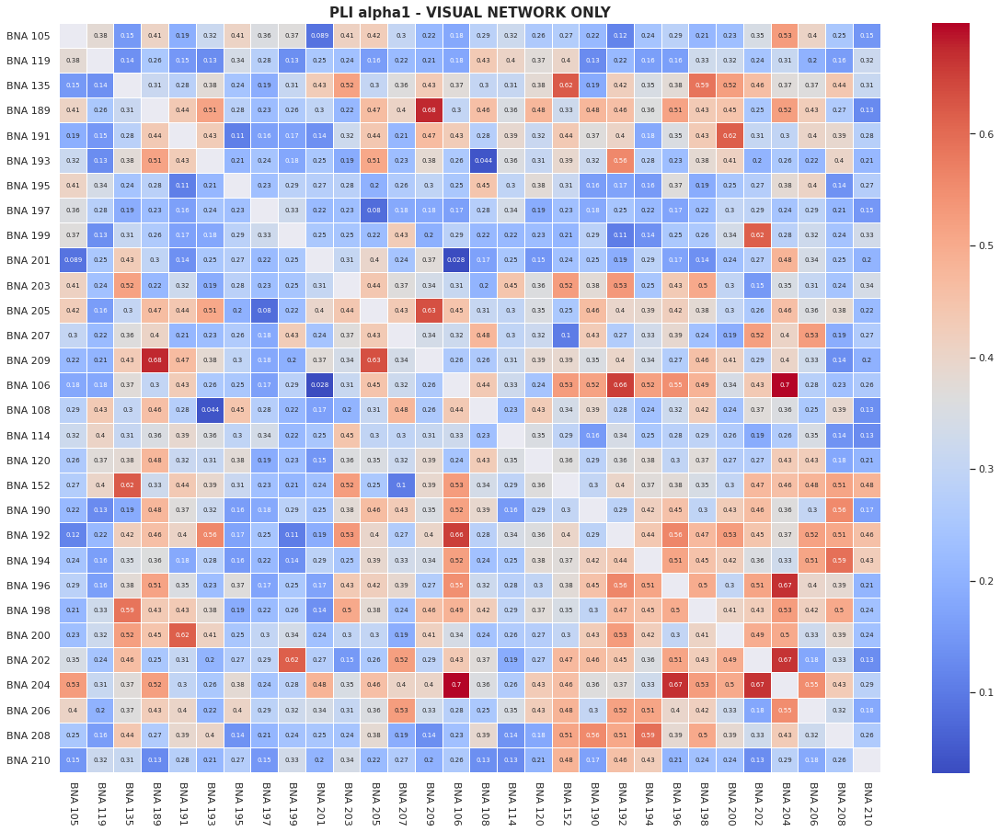

In [69]:
df_vis = df_reorder.iloc[vis,vis]
   
plt.figure(figsize=(20,15))
plt.xticks(rotation=270)
ax = sns.heatmap(df_vis, cmap=palette, annot=True, linewidths=0.01, annot_kws = {"size":7})
ax.set_title('PLI alpha1 - VISUAL NETWORK ONLY', size=15, fontweight='bold')
#labels = [value.get_text() for value in list(ax.get_xticklabels())]
#labelsy = [value.get_text() for value in list(ax.get_yticklabels())]
#ax.set_yticklabels(pd.DataFrame(names).iloc[labelsy][0], rotation=0)
#ax.set_xticklabels(pd.DataFrame(names).iloc[labels][0])
#ax.set_xlim(0, len(dfDMN))
#ax.set_ylim(len(dfDMN), 0)

In [ ]:
#REVIEW Idea: Why are we doing this ? What do we not want to see ? 

In [73]:
# Let's reorder the AEC also
aec_alpha1_reorder = reorder(df_aec_alpha1, subnet_filepath, subcortical=False)

# ...and rename
names = {i: regs['BNA region'][j] for i, j in zip(list(aec_alpha1_reorder), 
                                                  range(len(aec_alpha1_reorder)))}
aec_alpha1_reorder = aec_alpha1_reorder.rename(index = names, columns = names)
aec_alpha1_reorder

,BNA 105,BNA 119,BNA 135,BNA 189,BNA 191,BNA 193,BNA 195,BNA 197,BNA 199,BNA 201,...,BNA 82,BNA 84,BNA 88,BNA 122,BNA 144,BNA 154,BNA 176,BNA 178,BNA 182,BNA 188
BNA 105,NaN,0.542181,0.505167,0.552193,0.508195,0.502758,0.549829,0.565846,0.560468,0.539496,...,0.566984,0.535891,0.603864,0.568961,0.559575,0.554267,0.523536,0.512481,0.567728,0.536221
BNA 119,0.542181,NaN,0.558431,0.617473,0.577434,0.571999,0.527745,0.590249,0.543341,0.542021,...,0.659123,0.563676,0.641279,0.637776,0.551122,0.592472,0.569645,0.506250,0.570815,0.564685
BNA 135,0.505167,0.558431,NaN,0.592943,0.590748,0.594206,0.537691,0.578778,0.554554,0.516036,...,0.577353,0.507415,0.581069,0.562469,0.520902,0.562999,0.525706,0.464182,0.510757,0.558958
BNA 189,0.552193,0.617473,0.592943,NaN,0.633716,0.635038,0.609303,0.625980,0.617598,0.554536,...,0.562109,0.535813,0.592752,0.623058,0.568827,0.609615,0.594328,0.538592,0.551289,0.637700
BNA 191,0.508195,0.577434,0.590748,0.633716,NaN,0.571879,0.548994,0.575751,0.574944,0.534745,...,0.588524,0.519172,0.609790,0.625567,0.570409,0.587709,0.571173,0.568143,0.525744,0.639165
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BNA 154,0.554267,0.592472,0.562999,0.609615,0.587709,0.576637,0.598254,0.600135,0.544643,0.541489,...,0.588893,0.517183,0.563691,0.613114,0.597330,NaN,0.518590,0.550189,0.552749,0.556888
BNA 176,0.523536,0.569645,0.525706,0.594328,0.571173,0.547634,0.573112,0.575177,0.527988,0.511455,...,0.586287,0.504202,0.544566,0.601971,0.592576,0.518590,NaN,0.538964,0.521951,0.524127
BNA 178,0.512481,0.506250,0.464182,0.538592,0.568143,0.561215,0.486576,0.535501,0.551400,0.531808,...,0.524176,0.543650,0.531205,0.543795,0.509586,0.550189,0.538964,NaN,0.477332,0.574334
BNA 182,0.567728,0.570815,0.510757,0.551289,0.525744,0.523997,0.566238,0.590440,0.558404,0.563582,...,0.529349,0.556623,0.558672,0.541251,0.484999,0.552749,0.521951,0.477332,NaN,0.562268


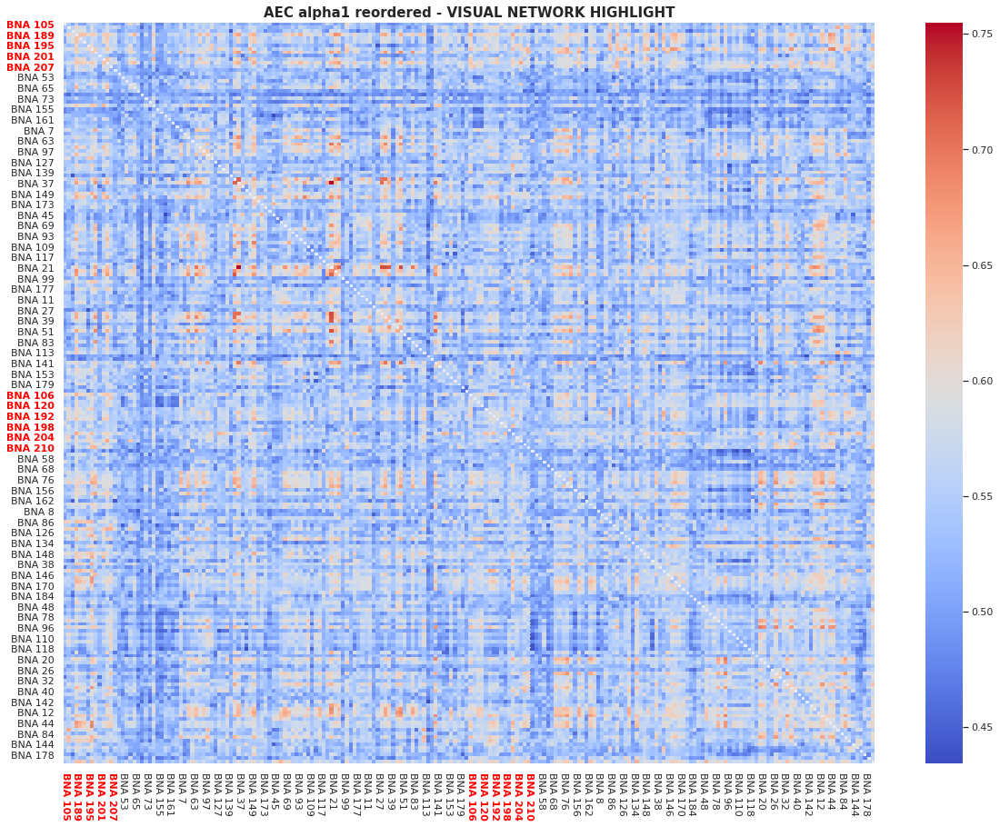

In [74]:
# AEC visual network
palette = 'coolwarm'

matdropped = aec_alpha1_reorder.dropna(axis=1, how='all').dropna(axis=0,how='all').copy()
plt.figure(figsize=(20,15))
plt.xticks(rotation=270)
ax = sns.heatmap(matdropped, cmap=palette, annot=False, xticklabels=3, yticklabels=3)
ax.set_title('AEC alpha1 reordered - VISUAL NETWORK HIGHLIGHT', size=15, fontweight='bold')

vis = np.where(regs==1)[0]
visNAMES = regs['BNA region'].iloc[vis]
visNAMES = list(visNAMES)
for laby,labx in zip(ax.get_yticklabels(), ax.get_xticklabels()):
    texty = laby.get_text()
    textx = labx.get_text()
    if texty in visNAMES:
        laby.set_weight('bold')
        laby.set_color('red')
    if textx in visNAMES:
        labx.set_weight('bold')
        labx.set_color('red')

Text(0.5, 1.0, 'AEC alpha1 - VISUAL NETWORK ONLY')

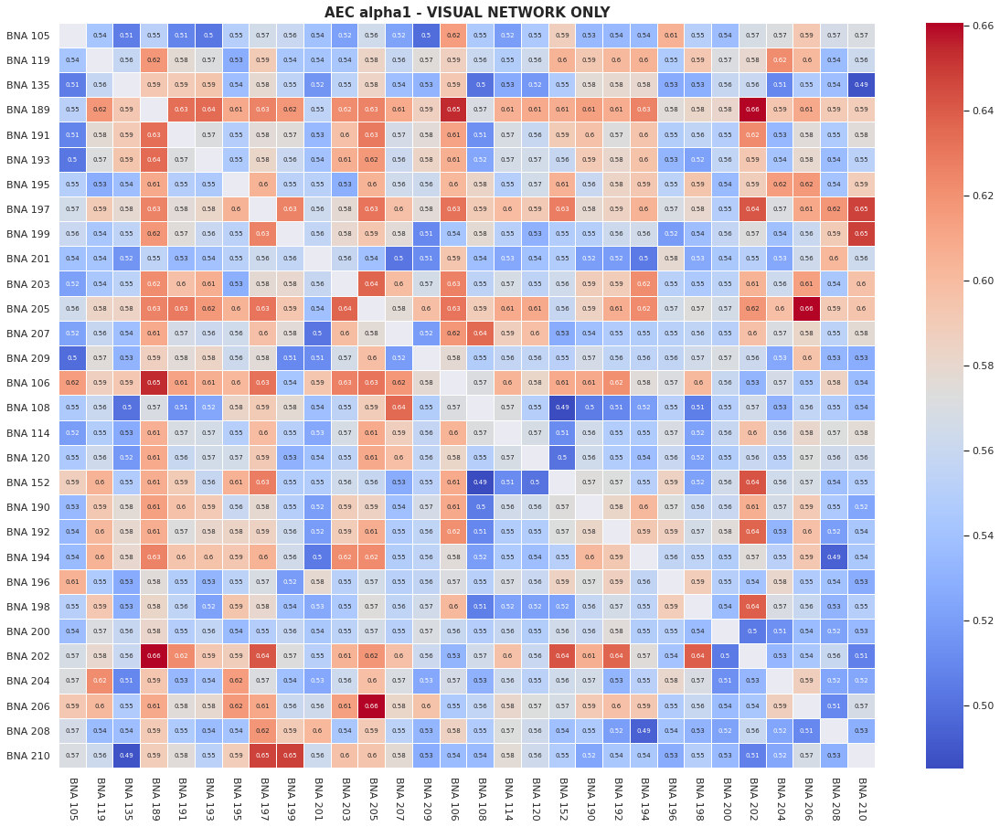

In [75]:
# And AEC visual network only
df_vis = aec_alpha1_reorder.iloc[vis,vis]
   
plt.figure(figsize=(20,15))
plt.xticks(rotation=270)
ax = sns.heatmap(df_vis, cmap=palette, annot=True, linewidths=0.01, annot_kws = {"size":7})
ax.set_title('AEC alpha1 - VISUAL NETWORK ONLY', size=15, fontweight='bold')